### 1. Importing libraries and data

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.model_selection import train_test_split

In [3]:
path = r'C:\Users\nodnarb\Documents\Machine Learning'

In [4]:
# Importing cleaned weather station data

df = df = pd.read_csv(os.path.join(path, '01 Data Sets', 'weather_cleaned.csv'))

In [8]:
# Importing pleasant weather data

pleasant = pd.read_csv(os.path.join(path, '01 Data Sets', 'pleasant_weather.csv'))

In [6]:
df.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,19600102,1,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,19600103,1,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,19600104,1,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,19600105,1,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [12]:
pleasant.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### 2. Data Prep

In [9]:
# Filtering weather station to only show decade 2000

df2000 = df[(df['DATE'].astype(str).str[:4] >= '2000') & (df['DATE'].astype(str).str[:4] <= '2009')]
df2000.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
14610,20000101,1,8,0.89,1.0286,0.20,0.03,0.0,2.9,1.6,...,0.7,6,0.89,1.0235,0.22,0.10,0.7,6.6,2.1,11.0
14611,20000102,1,8,0.87,1.0318,0.25,0.00,0.0,3.6,2.7,...,2.0,8,0.92,1.0177,0.13,0.42,0.0,9.6,7.3,10.6
14612,20000103,1,5,0.81,1.0314,0.50,0.00,3.7,2.2,0.1,...,2.8,4,0.79,1.0154,0.22,1.05,1.2,8.6,7.3,9.9
14613,20000104,1,7,0.79,1.0262,0.63,0.35,6.9,3.9,0.5,...,4.6,6,0.76,1.0099,0.36,0.34,3.5,8.1,5.0,7.7
14614,20000105,1,5,0.90,1.0246,0.51,0.07,3.7,6.0,3.8,...,2.9,7,0.81,0.9957,0.12,0.33,0.0,7.7,4.0,11.3


In [10]:
df2000.shape

(3653, 137)

In [12]:
pleasant2000.shape

(3653, 16)

In [14]:
# Filtering weather station to only show decade 1990

df1990 = df[(df['DATE'].astype(str).str[:4] >= '1990') & (df['DATE'].astype(str).str[:4] <= '1999')]
df1990.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
10958,19900101,1,0,0.83,1.0217,0.60,0.00,7.2,-2.1,-3.6,...,-0.3,3,0.82,1.0068,0.20,0.51,2.0,6.9,4.5,9.4
10959,19900102,1,2,0.84,1.0238,0.48,0.00,2.3,-1.8,-3.9,...,-3.4,5,0.79,1.0040,0.21,1.48,0.1,7.3,4.7,9.9
10960,19900103,1,8,0.89,1.0231,0.20,0.00,0.0,-2.2,-4.2,...,-2.6,4,0.90,1.0094,0.38,0.00,4.9,7.8,4.8,10.7
10961,19900104,1,2,0.77,1.0265,0.54,0.00,5.6,-0.7,-3.1,...,0.5,6,0.93,1.0112,0.13,0.92,0.0,6.5,2.0,11.0
10962,19900105,1,7,0.81,1.0286,0.23,0.04,0.2,0.0,-3.1,...,0.8,4,0.91,1.0108,0.20,0.56,1.2,9.4,7.2,11.7


In [16]:
# Filtering pleasant data to only show decade 2000

pleasant1990 = pleasant[(pleasant['DATE'].astype(str).str[:4] >= '1990') & (pleasant['DATE'].astype(str).str[:4] <= '1999')]
pleasant1990.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
10958,19900101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10959,19900102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10960,19900103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10961,19900104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10962,19900105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [13]:
# Dropping date and month column from weather data

df2000 = df2000.drop(columns = ['DATE', 'MONTH'])
df2000.head()

,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
14610,8,0.89,1.0286,0.20,0.03,0.0,2.9,1.6,3.9,7,...,0.7,6,0.89,1.0235,0.22,0.10,0.7,6.6,2.1,11.0
14611,8,0.87,1.0318,0.25,0.00,0.0,3.6,2.7,4.8,8,...,2.0,8,0.92,1.0177,0.13,0.42,0.0,9.6,7.3,10.6
14612,5,0.81,1.0314,0.50,0.00,3.7,2.2,0.1,4.8,5,...,2.8,4,0.79,1.0154,0.22,1.05,1.2,8.6,7.3,9.9
14613,7,0.79,1.0262,0.63,0.35,6.9,3.9,0.5,7.5,7,...,4.6,6,0.76,1.0099,0.36,0.34,3.5,8.1,5.0,7.7
14614,5,0.90,1.0246,0.51,0.07,3.7,6.0,3.8,8.6,7,...,2.9,7,0.81,0.9957,0.12,0.33,0.0,7.7,4.0,11.3


In [14]:
df2000.shape

(3653, 135)

In [18]:
# Dropping date and month column from weather data

df1990 = df1990.drop(columns = ['DATE', 'MONTH'])

In [15]:
# Dropping date column from pleasant data

pleasant2000 = pleasant2000.drop(columns = ['DATE'])
pleasant2000.head()

,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
14610,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14611,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14612,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14613,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14614,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [16]:
pleasant2000.shape

(3653, 15)

In [20]:
# Dropping date column from pleasant data

pleasant1990 = pleasant1990.drop(columns = ['DATE'])

In [54]:
# Turn X and y from a df to arrays

X = np.array(df2000)
y = np.array(pleasant2000)

In [22]:
# Turn X and y from a df to arrays

X1 = np.array(df1990)
y1 = np.array(pleasant1990)

In [56]:
X.shape

(3653, 135)

In [58]:
y.shape

(3653, 15)

In [24]:
X1.shape

(3652, 135)

In [28]:
y1.shape

(3652, 15)

In [64]:
# Split data into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 42)

In [30]:
# Split data into train and test sets

X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, random_state = 42)

In [66]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(2739, 135) (2739, 15)
(914, 135) (914, 15)


In [32]:
print(X1_train.shape, y1_train.shape)
print(X1_test.shape, y1_test.shape)

(2739, 135) (2739, 15)
(913, 135) (913, 15)


### 3. Random Forest Model

In [69]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier()

In [71]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.5700218818380745


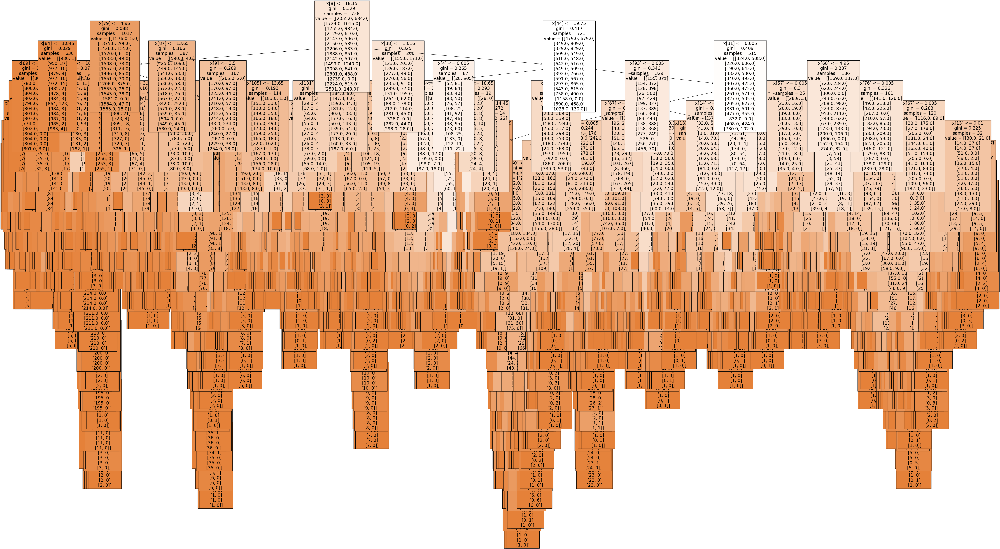

In [77]:
# Plot random forest for decade 2000

fig = plt.figure(figsize=(80,40))

plot_tree(clf.estimators_[15], fontsize = 20, class_names = ['unpleasant', 'pleasant'], filled=True);

In [79]:
fig.savefig(os.path.join(path, '03 Visuals', 'randomforest2000.png'),bbox_inches='tight')

In [45]:
# creating a RF classifier
clf1 = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf1.fit(X1_train, y1_train)

RandomForestClassifier()

In [47]:
# performing predictions on the test dataset
y1_pred = clf1.predict(X1_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y1_test, y1_pred))

Model Accuracy:  0.5815991237677984


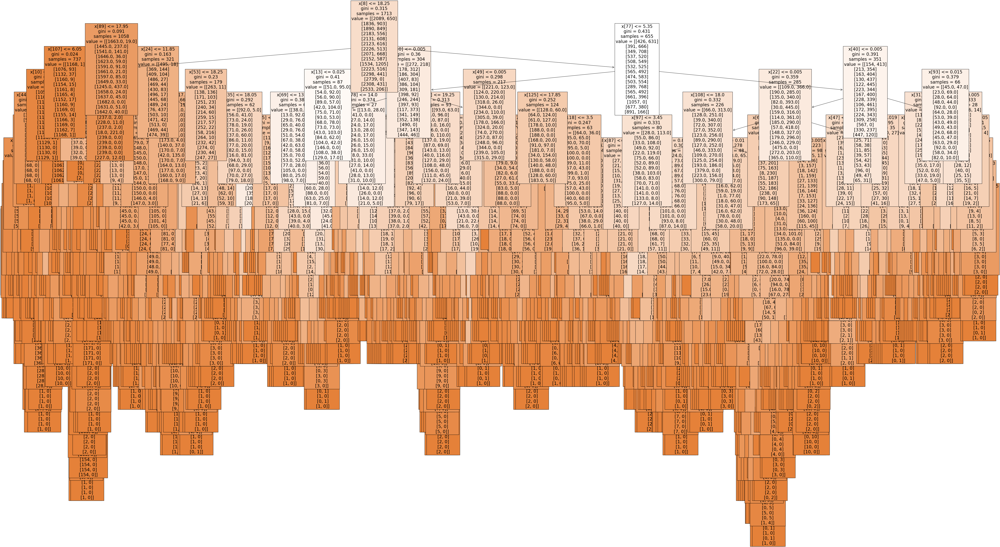

In [49]:
# Plot random forest for decade 1990

fig1 = plt.figure(figsize=(80,40))

plot_tree(clf1.estimators_[15], fontsize = 20, class_names = ['unpleasant', 'pleasant'], filled=True);

In [42]:
fig1.savefig(os.path.join(path, '03 Visuals', 'randomforest1990.png'),bbox_inches='tight')

### 4. Feature Importance

In [53]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_

#print(clf.feature_importances_.shape)
newarray

array([0.00250993, 0.00323008, 0.00302731, 0.00420072, 0.01548986,
       0.00483183, 0.00872645, 0.00501633, 0.02256467, 0.00330863,
       0.0036007 , 0.00383273, 0.00363453, 0.01374834, 0.00461132,
       0.00456626, 0.0049254 , 0.00984935, 0.00237389, 0.00309171,
       0.00302696, 0.00578109, 0.01244968, 0.00446478, 0.01187353,
       0.0034183 , 0.01502304, 0.00311788, 0.00236443, 0.00483849,
       0.00471733, 0.01497985, 0.00403346, 0.0109017 , 0.00235642,
       0.02022459, 0.00450297, 0.00340976, 0.00432314, 0.00583451,
       0.01772094, 0.00831212, 0.01968765, 0.00269107, 0.03443784,
       0.00236205, 0.00329289, 0.00422161, 0.00348778, 0.00812812,
       0.00367718, 0.01199498, 0.00268404, 0.01073144, 0.00281447,
       0.00400271, 0.00319179, 0.01376471, 0.00488828, 0.03069985,
       0.00350243, 0.00289918, 0.02367836, 0.00356288, 0.00341072,
       0.00307465, 0.00408238, 0.01664532, 0.00457033, 0.00602659,
       0.00262235, 0.02570913, 0.00552158, 0.00484359, 0.00392

In [55]:
# Reshape the feature importances to (-1, 15, 9)

newarray = newarray.reshape(-1, 15, 9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[0.00250993, 0.00323008, 0.00302731, 0.00420072, 0.01548986,
         0.00483183, 0.00872645, 0.00501633, 0.02256467],
        [0.00330863, 0.0036007 , 0.00383273, 0.00363453, 0.01374834,
         0.00461132, 0.00456626, 0.0049254 , 0.00984935],
        [0.00237389, 0.00309171, 0.00302696, 0.00578109, 0.01244968,
         0.00446478, 0.01187353, 0.0034183 , 0.01502304],
        [0.00311788, 0.00236443, 0.00483849, 0.00471733, 0.01497985,
         0.00403346, 0.0109017 , 0.00235642, 0.02022459],
        [0.00450297, 0.00340976, 0.00432314, 0.00583451, 0.01772094,
         0.00831212, 0.01968765, 0.00269107, 0.03443784],
        [0.00236205, 0.00329289, 0.00422161, 0.00348778, 0.00812812,
         0.00367718, 0.01199498, 0.00268404, 0.01073144],
        [0.00281447, 0.00400271, 0.00319179, 0.01376471, 0.00488828,
         0.03069985, 0.00350243, 0.00289918, 0.02367836],
        [0.00356288, 0.00341072, 0.00307465, 0.00408238, 0.01664532,
         0.00457033, 0.00602659, 0.0026223

In [63]:
# Sum the values across the last dimension to get one observation for each weather station

sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.06959718, 0.05207726, 0.06150298, 0.06753415, 0.10092   ,
       0.05058009, 0.08944177, 0.06970435, 0.1251072 , 0.06478631,
       0.06383415, 0.04888302, 0.04776337, 0.05796241, 0.03030577])

In [65]:
# Create list for weather stations

weather_stations = ['BASEL', 'BELGRADE', 'BUDAPEST', 'DEBILT', 'DUSSELDORF', 
                    'HEATHROW', 'KASSEL', 'LJUBLJANA', 'MAASTRICHT', 'MADRID', 
                    'MUNCHENB', 'OSLO', 'SONNBLICK', 'STOCKHOLM', 'VALENTIA']

In [69]:
important = pd.Series(sumarray, index = weather_stations) #.sort_values(ascending = False)
important = important.sort_values(ascending = False)
important

MAASTRICHT    0.125107
DUSSELDORF    0.100920
KASSEL        0.089442
LJUBLJANA     0.069704
BASEL         0.069597
DEBILT        0.067534
MADRID        0.064786
MUNCHENB      0.063834
BUDAPEST      0.061503
STOCKHOLM     0.057962
BELGRADE      0.052077
HEATHROW      0.050580
OSLO          0.048883
SONNBLICK     0.047763
VALENTIA      0.030306
dtype: float64

In [75]:
# Create a df to associate weather stations with their importances

df_importance = pd.DataFrame({
    'Weather Station': weather_stations,
    'Importance': sumarray
})

df_importance = df_importance.sort_values(by='Importance', ascending = False)

Text(0.5, 1.0, 'Weather Station Importance 2000s')

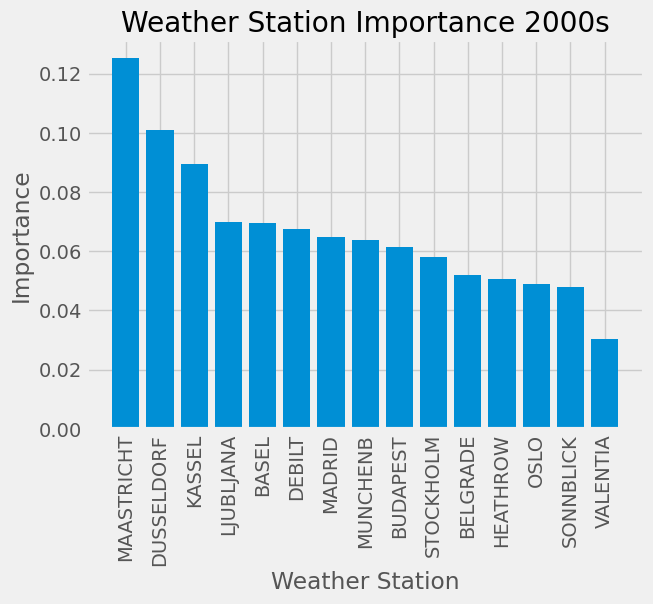

In [81]:
# Plot the importances

%matplotlib inline

plt.style.use('fivethirtyeight')

plt.bar(df_importance['Weather Station'], df_importance['Importance'], orientation = 'vertical')
plt.xticks(rotation='vertical')
plt.xlabel('Weather Station')
plt.ylabel('Importance')
plt.title('Weather Station Importance 2000s')

### 5. Maastricht 

In [16]:
# Create a list of the columns containing "Maastricht" in their names

maas = list(x for x in df.columns if x.find('MAASTRICHT') >=0)
maas

['MAASTRICHT_cloud_cover',
 'MAASTRICHT_humidity',
 'MAASTRICHT_pressure',
 'MAASTRICHT_global_radiation',
 'MAASTRICHT_precipitation',
 'MAASTRICHT_sunshine',
 'MAASTRICHT_temp_mean',
 'MAASTRICHT_temp_min',
 'MAASTRICHT_temp_max']

In [18]:
# Create a dataframe with those columns

dfmaas = df[maas]
dfmaas

,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max
0,7,0.83,1.0063,0.22,0.32,1.0,9.5,8.5,11.1
1,8,0.92,1.0062,0.17,1.34,0.4,8.6,7.5,9.9
2,7,0.97,1.0167,0.12,0.46,0.0,6.9,5.5,9.9
3,7,0.89,1.0277,0.16,0.00,0.3,7.0,3.0,10.0
4,7,0.92,1.0259,0.12,0.56,0.0,8.1,2.5,11.1
...,...,...,...,...,...,...,...,...,...
22945,8,0.67,1.0201,1.17,0.20,5.3,18.6,14.1,22.6
22946,7,0.70,1.0190,1.17,0.20,5.0,18.9,15.8,23.5
22947,8,0.69,1.0183,1.17,0.20,3.2,18.2,13.7,24.3
22948,8,0.73,1.0181,1.17,0.20,6.8,16.3,12.8,21.4


In [34]:
# Reduce pleasant weather to Maastricht

pleasantmaas = pleasant['MAASTRICHT_pleasant_weather']
pleasantmaas

0        0
1        0
2        0
3        0
4        0
        ..
22945    0
22946    0
22947    0
22948    0
22949    0
Name: MAASTRICHT_pleasant_weather, Length: 22950, dtype: int64

In [22]:
dfmaas.shape

(22950, 9)

In [36]:
pleasantmaas.shape

(22950,)

In [46]:
X = dfmaas

In [44]:
y = pleasantmaas

In [50]:
# Turn X2 and y2 from df to arrays

X = np.array(X)
y = np.array(y)

In [52]:
# Split data into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [54]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [56]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters

clf.fit(X_train, y_train)

RandomForestClassifier()

In [58]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


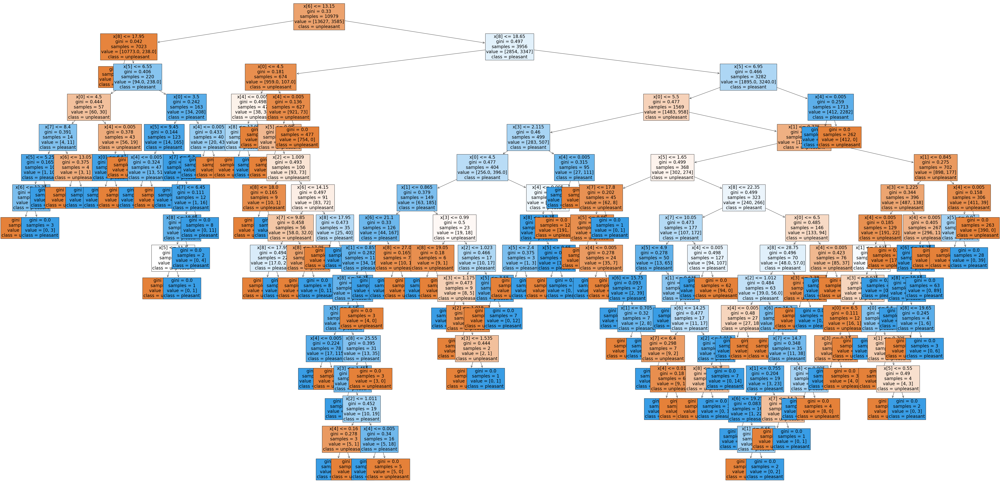

In [60]:
# Plot random forest for decade 1990

fig2 = plt.figure(figsize=(80,40))

plot_tree(clf.estimators_[15], fontsize = 20, class_names = ['unpleasant', 'pleasant'], filled=True);

In [62]:
fig2.savefig(os.path.join(path, '03 Visuals', 'maastricht.png'),bbox_inches='tight')

In [64]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_

#print(clf.feature_importances_.shape)
newarray

array([0.03182179, 0.02775743, 0.01298821, 0.07053619, 0.32084065,
       0.07232946, 0.14902713, 0.02112333, 0.29357581])

In [66]:
# Create a list of weather features

features = [feature.replace('MAASTRICHT_', '') for feature in maas]
features

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [68]:
important = pd.Series(newarray, index = features)
important

cloud_cover         0.031822
humidity            0.027757
pressure            0.012988
global_radiation    0.070536
precipitation       0.320841
sunshine            0.072329
temp_mean           0.149027
temp_min            0.021123
temp_max            0.293576
dtype: float64

In [74]:
# Create a df to associate weather stations with their importances

df_importance1 = pd.DataFrame({
    'Features': features,
    'Importance': important
})

df_importance1 = df_importance1.sort_values(by='Importance', ascending = False)

Text(0.5, 1.0, 'Maastricht Features')

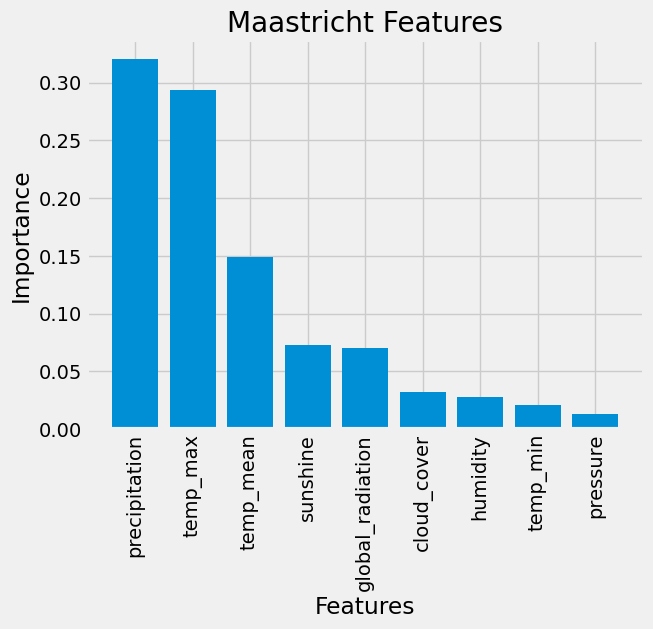

In [78]:
# Plot the importances

%matplotlib inline

plt.style.use('fivethirtyeight')

plt.bar(df_importance1['Features'], df_importance1['Importance'], orientation = 'vertical')
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Maastricht Features')

### 6. Dusseldorf

In [85]:
# Create a list of the columns containing "Dusseldorf" in their names

duss = list(x for x in df.columns if x.find('DUSSELDORF') >=0)
duss

['DUSSELDORF_cloud_cover',
 'DUSSELDORF_humidity',
 'DUSSELDORF_pressure',
 'DUSSELDORF_global_radiation',
 'DUSSELDORF_precipitation',
 'DUSSELDORF_sunshine',
 'DUSSELDORF_temp_mean',
 'DUSSELDORF_temp_min',
 'DUSSELDORF_temp_max']

In [83]:
# Create a dataframe with those columns

dfduss = df[duss]
dfduss

,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max
0,8,0.83,1.0161,0.12,0.08,0.0,10.0,7.0,11.5
1,8,0.89,1.0161,0.18,0.66,0.5,8.2,7.4,11.0
2,7,0.95,1.0161,0.12,0.07,0.0,7.1,6.9,9.1
3,8,0.86,1.0161,0.12,0.02,0.0,6.8,3.6,8.0
4,7,0.92,1.0161,0.12,0.62,0.0,7.7,6.2,11.0
...,...,...,...,...,...,...,...,...,...
22945,8,0.75,1.0214,1.13,0.20,6.4,17.8,13.6,21.4
22946,7,0.71,1.0186,1.13,0.20,4.9,19.4,15.4,23.9
22947,8,0.73,1.0196,1.13,0.20,4.0,18.2,13.4,22.0
22948,7,0.73,1.0176,1.13,0.20,6.9,16.7,11.9,21.1


In [89]:
# Reduce pleasant weather to Dusseldorf

pleasantduss = pleasant['DUSSELDORF_pleasant_weather']
pleasantduss

0        0
1        0
2        0
3        0
4        0
        ..
22945    0
22946    0
22947    0
22948    0
22949    0
Name: DUSSELDORF_pleasant_weather, Length: 22950, dtype: int64

In [91]:
# Turn X2 and y2 from df to arrays

X = np.array(dfduss)
y = np.array(pleasantduss)

In [93]:
# Split data into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [95]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [97]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters

clf.fit(X_train, y_train)

RandomForestClassifier()

In [99]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


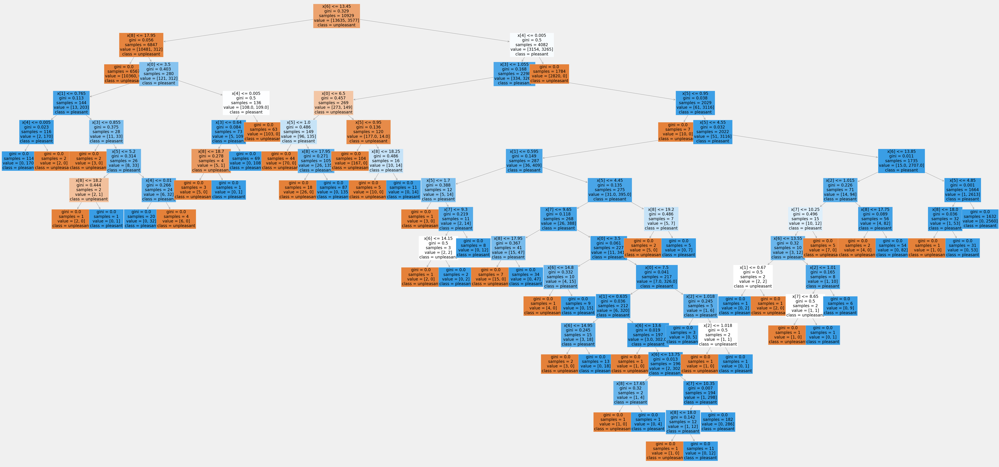

In [101]:
# Plot random forest for decade 1990

fig2 = plt.figure(figsize=(80,40))

plot_tree(clf.estimators_[15], fontsize = 20, class_names = ['unpleasant', 'pleasant'], filled=True);

In [140]:
fig2.savefig(os.path.join(path, '03 Visuals', 'dusseldorf.png'),bbox_inches='tight')

In [105]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_

#print(clf.feature_importances_.shape)
newarray

array([0.03853607, 0.01491251, 0.01309396, 0.11076097, 0.35321926,
       0.07991695, 0.10714525, 0.01218436, 0.27023068])

In [107]:
# Create a list of weather features

features = [feature.replace('DUSSELDORF_', '') for feature in duss]
features

['cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max']

In [109]:
important = pd.Series(newarray, index = features)
important

cloud_cover         0.038536
humidity            0.014913
pressure            0.013094
global_radiation    0.110761
precipitation       0.353219
sunshine            0.079917
temp_mean           0.107145
temp_min            0.012184
temp_max            0.270231
dtype: float64

In [111]:
# Create a df to associate weather stations with their importances

df_importance1 = pd.DataFrame({
    'Features': features,
    'Importance': important
})

df_importance1 = df_importance1.sort_values(by='Importance', ascending = False)

Text(0.5, 1.0, 'Dusseldorf Features')

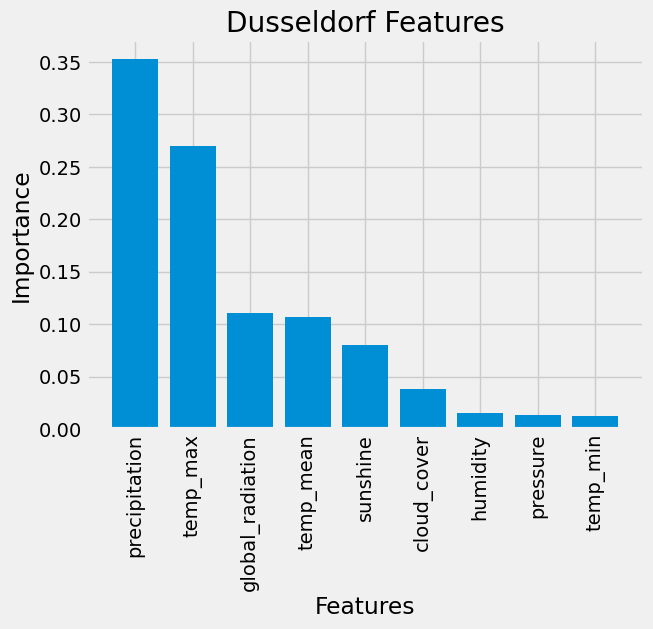

In [113]:
# Plot the importances

%matplotlib inline

plt.style.use('fivethirtyeight')

plt.bar(df_importance1['Features'], df_importance1['Importance'], orientation = 'vertical')
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Dusseldorf Features')

### 7. Kassel

In [116]:
# Create a list of the columns containing "Kassel" in their names

kass = list(x for x in df.columns if x.find('KASSEL') >=0)
kass

['KASSEL_humidity',
 'KASSEL_pressure',
 'KASSEL_global_radiation',
 'KASSEL_precipitation',
 'KASSEL_sunshine',
 'KASSEL_temp_mean',
 'KASSEL_cloud_cover',
 'KASSEL_temp_min',
 'KASSEL_temp_max']

In [118]:
# Create a dataframe with those columns

dfkass = df[kass]
dfkass

,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_cloud_cover,KASSEL_temp_min,KASSEL_temp_max
0,0.82,1.0094,0.28,0.48,1.6,7.9,8,3.9,9.4
1,0.86,1.0086,0.12,0.27,0.0,7.7,6,6.8,9.1
2,0.91,1.0129,0.12,0.60,0.0,6.5,8,6.0,8.0
3,0.87,1.0290,0.12,0.00,0.0,5.8,6,5.2,6.5
4,0.86,1.0262,0.13,0.71,0.0,5.4,7,3.7,6.0
...,...,...,...,...,...,...,...,...,...
22945,0.77,1.0161,1.14,0.19,4.0,9.1,4,5.4,13.1
22946,0.77,1.0161,1.14,0.19,4.0,9.1,3,5.4,13.1
22947,0.77,1.0161,1.14,0.19,4.0,9.1,3,5.4,13.1
22948,0.77,1.0161,1.14,0.19,4.0,9.1,3,5.4,13.1


In [122]:
# Reduce pleasant weather to Kassel

pleasantkass = pleasant['KASSEL_pleasant_weather']
pleasantkass

0        0
1        0
2        0
3        0
4        0
        ..
22945    0
22946    0
22947    0
22948    0
22949    0
Name: KASSEL_pleasant_weather, Length: 22950, dtype: int64

In [124]:
# Turn X2 and y2 from df to arrays

X = np.array(dfkass)
y = np.array(pleasantkass)

In [126]:
# Split data into train and test sets

X_train, X_test, y_train, y_test = train_test_split(X,y,random_state = 42)

In [128]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


In [130]:
# Create a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters

clf.fit(X_train, y_train)

RandomForestClassifier()

In [132]:
# Perform predictions on the test dataset
y_pred = clf.predict(X_test)
  
# Use metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  1.0


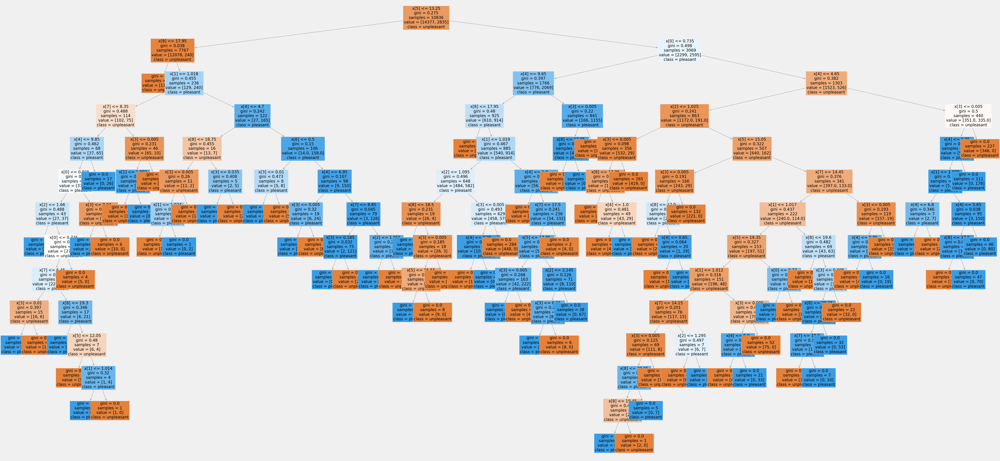

In [134]:
# Plot random forest for Kassel

fig3 = plt.figure(figsize=(80,40))

plot_tree(clf.estimators_[15], fontsize = 20, class_names = ['unpleasant', 'pleasant'], filled=True);

In [138]:
fig3.savefig(os.path.join(path, '03 Visuals', 'kassel.png'),bbox_inches='tight')

In [142]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_

#print(clf.feature_importances_.shape)
newarray

array([0.04163195, 0.02309909, 0.05875076, 0.32917215, 0.09567362,
       0.14833141, 0.00150745, 0.02231148, 0.2795221 ])

In [144]:
# Create a list of weather features

features = [feature.replace('KASSEL_', '') for feature in kass]
features

['humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'cloud_cover',
 'temp_min',
 'temp_max']

In [146]:
important = pd.Series(newarray, index = features)
important

humidity            0.041632
pressure            0.023099
global_radiation    0.058751
precipitation       0.329172
sunshine            0.095674
temp_mean           0.148331
cloud_cover         0.001507
temp_min            0.022311
temp_max            0.279522
dtype: float64

In [148]:
# Create a df to associate weather stations with their importances

df_importance1 = pd.DataFrame({
    'Features': features,
    'Importance': important
})

df_importance1 = df_importance1.sort_values(by='Importance', ascending = False)

Text(0.5, 1.0, 'Kassel Features')

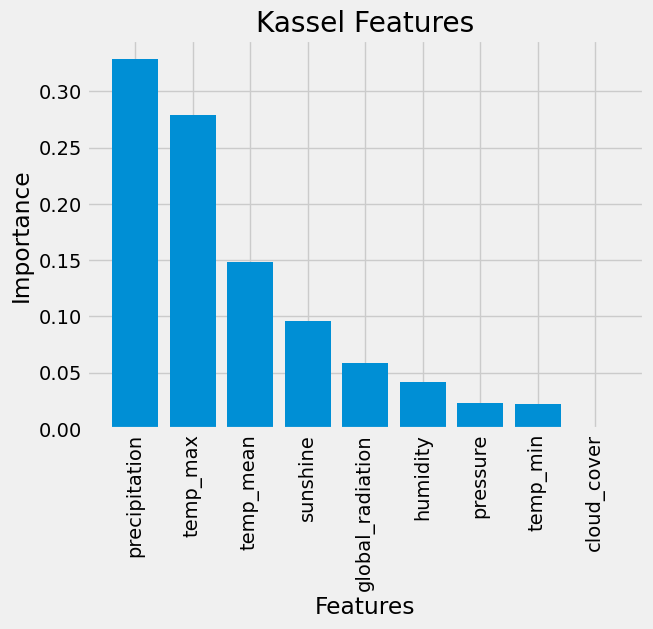

In [152]:
# Plot the importances

%matplotlib inline

plt.style.use('fivethirtyeight')

plt.bar(df_importance1['Features'], df_importance1['Importance'], orientation = 'vertical')
plt.xticks(rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Kassel Features')